In [1]:
%load_ext autoreload
%autoreload 2

# general
import numpy as np
import matplotlib.pyplot as plt
import shapely.geometry as sgeometry
import cartopy.crs as ccrs
from pathlib import Path

# spatial
import xarray as xa
import pandas as pd
import geopandas as gpd
import dask_geopandas as daskgpd
import rasterio
from rasterio import features as featuresio
from rasterio.enums import MergeAlg
import rioxarray as rio
# import xesmf as xe    # crashing on 'regridding'. TODO: try with example data
import netCDF4

# Introduction

A first look at doing using ML to predict fractional benthic coverage from satellite data using CORAL data as a pseudo-ground truth

## A simple to-do list
1. Download Heron island PRISM data: couldn't find the referenced image on the Ocean Color website (LC08_L2SP_091076_20161026_20200905_02_T1)
2. Download harmonised Sentinel-2/Landsat data: closest day +- one week (to keep it small)
3. Align images
4. Visualise PRISM crossing basemap

## Thoughts
- Hinges on CORAL data itself. This is the same as any other SL task: reliant on the accuracy of the ground truth.

## 1. Downloading PRISM data

Couldn't find the referenced image on the [Ocean Color website](https://oceandata.sci.gsfc.nasa.gov/coral_browser/) (LC08_L2SP_091076_20161026_20200905_02_T1). Instead downloaded: 2016-09-09T00:25:47Z due to relatively low cloud cover and range of features.

Downloading the .nc files involved copying and pasting individual https request. Each file ~3GB.

.nc files open to show only attributes. Open correctly (I assume) in QGIS. This is because they are non-standard netcdf files (unstructured, no assigned coordinates, group structure) which require processing.

Slightly more streamlined [NASA EarthDataSearch](https://search.earthdata.nasa.gov/search/granules?p=C1653653611-OB_DAAC&pg[0][v]=f&pg[0][qt]=2016-10-09T00%3A00%3A00.000Z%2C2016-10-24T23%3A59%3A59.999Z&pg[0][gsk]=-start_date&g=G1684254145-OB_DAAC&q=coral&tl=1724289606.325!3!!&lat=-13.871412249999999&long=146.6468811&zoom=7) results in same: apparently large file loading only attributes. Tried opening with netCDF4 directly: no difference. Reeks of corrupted files.

What is the L1 and L2 distinction? L1 is unprocessed, L2 contains derived values. N.B. PRISM also has [two channels](https://prism.jpl.nasa.gov/SWIR_char.html) (which have different centres and different bandwidths) sometimes called L1 and L2 which confuses things.

In-situ data available from SeaBASS in-situ bio-optical data archive in [.sb (.seabass) format](https://seabass.gsfc.nasa.gov/wiki/Getting_Started#Python%20reader). Sketchy unsupported-looking [Python library for opening those](https://seabass.gsfc.nasa.gov/wiki/readsb_python).

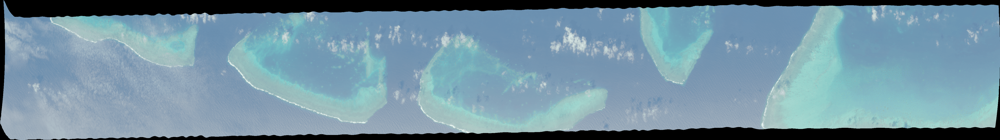
*.png image provided alongside .nc files*

In [3]:
# inspect netCDF file
nc = netCDF4.Dataset('/Users/rt582/Downloads/PRM2016288001459-L2.nc', mode='r')
for group_name, group in nc.groups.items():
    print(f'\nGroup: {group_name}')
    print('Variables:', group.variables.keys())
    print('Dimensions:', group.dimensions.keys())

nc.close()


Group: sensor_band_parameters
Variables: dict_keys(['wavelength', 'fwhm', 'benthic_wavelength'])
Dimensions: dict_keys([])

Group: scan_line_attributes
Variables: dict_keys(['scan_start_time', 'scan_end_time'])
Dimensions: dict_keys([])

Group: navigation_data
Variables: dict_keys(['longitude', 'latitude', 'height', 'range', 'sensor_zenith', 'sensor_azimuth', 'solar_zenith', 'solar_azimuth'])
Dimensions: dict_keys([])

Group: derived_data
Variables: dict_keys(['Rsw', 'Rb', 'depth', 'coral', 'sand', 'algae', 'GPP', 'G', 'Kd'])
Dimensions: dict_keys([])


In [4]:
xa.open_dataset("/Users/rt582/Downloads/PRM2016288001459-L2.nc", group="scan_line_attributes")

<xarray.Dataset> Size: 65kB
Dimensions:          (number_of_scans: 4065)
Dimensions without coordinates: number_of_scans
Data variables:
    scan_start_time  (number_of_scans) timedelta64[ns] 33kB ...
    scan_end_time    (number_of_scans) timedelta64[ns] 33kB ...

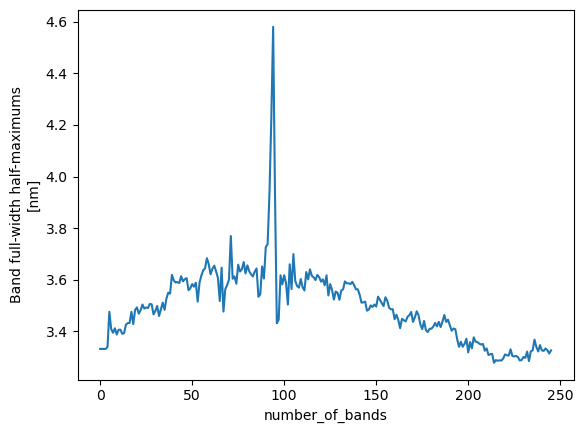

In [5]:
xa.open_dataset("/Users/rt582/Downloads/PRM2016288001459-L2.nc", group="sensor_band_parameters")["fwhm"].plot()

In [34]:
import prism_utils as pu
test_irregular_prism = pu.rearrange_prism_nc('/Users/rt582/Downloads/PRM2016288001459-L2.nc')
test_irregular_prism

/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/reeftruth/prism_utils.py:41: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  #     lon=(("lat", "lon"), lons.data)


<xarray.Dataset> Size: 88MB
Dimensions:  (lat: 4065, lon: 674, j: 4065, i: 674)
Coordinates:
    lat      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
    lon      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
  * i        (i) int64 5kB 0 1 2 3 4 5 6 7 8 ... 666 667 668 669 670 671 672 673
  * j        (j) int64 33kB 0 1 2 3 4 5 6 ... 4058 4059 4060 4061 4062 4063 4064
Data variables:
    coral    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    algae    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    sand     (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    depth    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    GPP      (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    G        (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
Attributes: (12/42)
    title:                             PRISM Level-2 Data
    sensor:                            PRISM (Portable Remote Imaging Spectro...
    instrument:                        PRISM
    platform:                          Tempus Applied Solutions Gulfstream-IV
    product_name:                      PRM2016288001459.L2.nc
    processing_version:                V1.0
    ...                                ...
    geospatial_lat_max:                -13.751568794250488
    geospatial_lat_min:                -13.991783142089844
    geospatial_lon_max:                146.7617950439453
    geospatial_lon_min:                146.53033447265625
    day_night_flag:                    Day
    earth_sun_distance_correction:     0.9971799850463867

In [2]:
import prism_utils as pu
irregular_prism = pu.rearrange_prism_nc('/Users/rt582/Downloads/PRM2016288001459-L2.nc')
irregular_prism

/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/reeftruth/prism_utils.py:45: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  ds = ds.assign_coords({"i": np.arange(ds.dims["lon"]), "j": np.arange(ds.dims["lat"])})


<xarray.Dataset> Size: 88MB
Dimensions:  (lat: 4065, lon: 674, j: 4065, i: 674)
Coordinates:
    lat      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
    lon      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
  * i        (i) int64 5kB 0 1 2 3 4 5 6 7 8 ... 666 667 668 669 670 671 672 673
  * j        (j) int64 33kB 0 1 2 3 4 5 6 ... 4058 4059 4060 4061 4062 4063 4064
Data variables:
    coral    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    algae    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    sand     (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    depth    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    GPP      (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    G        (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
Attributes: (12/42)
    title:                             PRISM Level-2 Data
    sensor:                            PRISM (Portable Remote Imaging Spectro...
    instrument:                        PRISM
    platform:                          Tempus Applied Solutions Gulfstream-IV
    product_name:                      PRM2016288001459.L2.nc
    processing_version:                V1.0
    ...                                ...
    geospatial_lat_max:                -13.751568794250488
    geospatial_lat_min:                -13.991783142089844
    geospatial_lon_max:                146.7617950439453
    geospatial_lon_min:                146.53033447265625
    day_night_flag:                    Day
    earth_sun_distance_correction:     0.9971799850463867

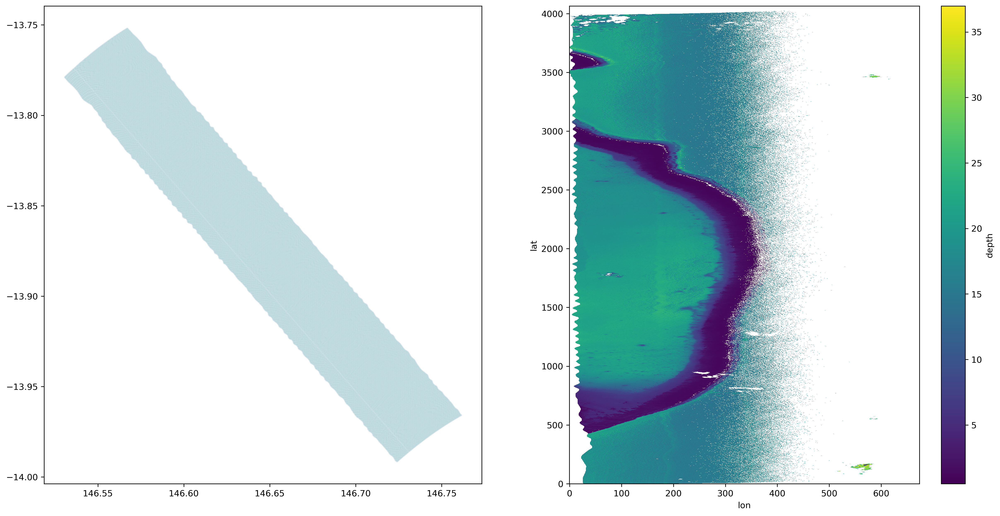

In [31]:
f, axes = plt.subplots(1, 2, figsize=(20, 10), dpi=300)
# visualise irregular prism datapoints
axes[0].scatter(x=irregular_prism.lon.values, y=irregular_prism.lat.values, s=0.0001, alpha=0.2)
# example plot
irregular_prism.depth.plot(ax=axes[1])

In [8]:
nav_data = xa.open_dataset("/Users/rt582/Downloads/PRM2016288001459-L2.nc", group="navigation_data")
derived_data = xa.open_dataset("/Users/rt582/Downloads/PRM2016288001459-L2.nc", group="derived_data")

In [19]:
test = pu.test_rearrange_prism_nc('/Users/rt582/Downloads/PRM2016288001459-L2.nc')
test

<xarray.Dataset> Size: 88MB
Dimensions:  (lat: 4065, lon: 674)
Coordinates:
    lat      (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    lon      (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
Data variables:
    coral    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    algae    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    sand     (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    depth    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    GPP      (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    G        (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
Attributes: (12/42)
    title:                             PRISM Level-2 Data
    sensor:                            PRISM (Portable Remote Imaging Spectro...
    instrument:                        PRISM
    platform:                          Tempus Applied Solutions Gulfstream-IV
    product_name:                      PRM2016288001459.L2.nc
    processing_version:                V1.0
    ...                                ...
    geospatial_lat_max:                -13.751568794250488
    geospatial_lat_min:                -13.991783142089844
    geospatial_lon_max:                146.7617950439453
    geospatial_lon_min:                146.53033447265625
    day_night_flag:                    Day
    earth_sun_distance_correction:     0.9971799850463867

In [59]:
irregular_prism

<xarray.Dataset> Size: 88MB
Dimensions:  (lat: 4065, lon: 674, j: 4065, i: 674)
Coordinates:
    lat      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
    lon      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
  * i        (i) int64 5kB 0 1 2 3 4 5 6 7 8 ... 666 667 668 669 670 671 672 673
  * j        (j) int64 33kB 0 1 2 3 4 5 6 ... 4058 4059 4060 4061 4062 4063 4064
Data variables:
    coral    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    algae    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    sand     (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    depth    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    GPP      (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    G        (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
Attributes: (12/42)
    title:                             PRISM Level-2 Data
    sensor:                            PRISM (Portable Remote Imaging Spectro...
    instrument:                        PRISM
    platform:                          Tempus Applied Solutions Gulfstream-IV
    product_name:                      PRM2016288001459.L2.nc
    processing_version:                V1.0
    ...                                ...
    geospatial_lat_max:                -13.751568794250488
    geospatial_lat_min:                -13.991783142089844
    geospatial_lon_max:                146.7617950439453
    geospatial_lon_min:                146.53033447265625
    day_night_flag:                    Day
    earth_sun_distance_correction:     0.9971799850463867

In [64]:
irregular_prism["lat"]

<xarray.DataArray 'lat' (j: 4065, i: 674)> Size: 11MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    lat      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
    lon      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
  * i        (i) int64 5kB 0 1 2 3 4 5 6 7 8 ... 666 667 668 669 670 671 672 673
  * j        (j) int64 33kB 0 1 2 3 4 5 6 ... 4058 4059 4060 4061 4062 4063 4064

In [66]:
irregular_prism["j"]

<xarray.DataArray 'j' (j: 4065)> Size: 33kB
array([   0,    1,    2, ..., 4062, 4063, 4064])
Coordinates:
  * j        (j) int64 33kB 0 1 2 3 4 5 6 ... 4058 4059 4060 4061 4062 4063 4064

In [9]:
irregular_prism.isel({'lat': slice(0, 100), 'lon': slice(0,100)}).coral.shape

(100, 100)

In [63]:
irregular_prism[["coral", "depth"]]

<xarray.Dataset> Size: 22MB
Dimensions:  (lat: 4065, lon: 674)
Dimensions without coordinates: lat, lon
Data variables:
    coral    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    depth    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
Attributes: (12/42)
    title:                             PRISM Level-2 Data
    sensor:                            PRISM (Portable Remote Imaging Spectro...
    instrument:                        PRISM
    platform:                          Tempus Applied Solutions Gulfstream-IV
    product_name:                      PRM2016288001459.L2.nc
    processing_version:                V1.0
    ...                                ...
    geospatial_lat_max:                -13.751568794250488
    geospatial_lat_min:                -13.991783142089844
    geospatial_lon_max:                146.7617950439453
    geospatial_lon_min:                146.53033447265625
    day_night_flag:                    Day
    earth_sun_distance_correction:     0.9971799850463867

In [57]:
irregular_prism.coords

Coordinates:
    lat      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
    lon      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
  * i        (i) int64 5kB 0 1 2 3 4 5 6 7 8 ... 666 667 668 669 670 671 672 673
  * j        (j) int64 33kB 0 1 2 3 4 5 6 ... 4058 4059 4060 4061 4062 4063 4064

In [56]:
irregular_prism["coral"]

<xarray.DataArray 'coral' (lat: 4065, lon: 674)> Size: 11MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Dimensions without coordinates: lat, lon

In [5]:
# resampled = pu.irregular_to_regular(
#     # irregular_prism.isel({'lat': slice(0, 100), 'lon': slice(0,100), 'j': slice(0, 100), 'i': slice(0,100)}),    # irregular_prism,
#     irregular_prism,
#     # irregular_prism[["coral", "depth"]],
#     1000)

  0%|          | 0/6 [00:00<?, ?it/s]

: 

: 

In [3]:
resampled = pu.irregular_to_regular(
    irregular_prism,
    10
)
# 3m25s for 10x10

100%|██████████| 6/6 [03:22<00:00, 33.68s/it]


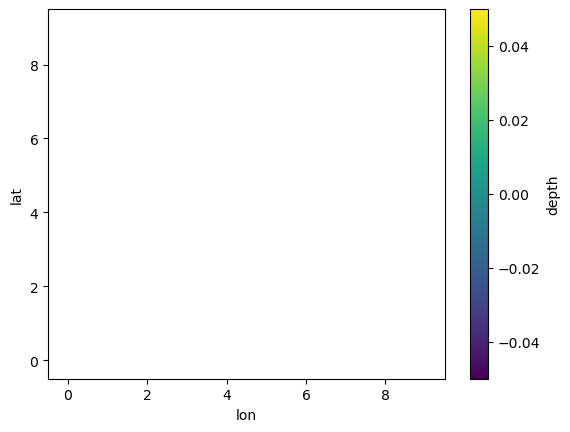

In [5]:
resampled.depth.plot()

In [ ]:
irregular_prism.isel({'lat': slice(0, 100), 'lon': slice(0,100), 'j': slice(0, 100), 'i': slice(0,100)})["lat"]

<xarray.DataArray 'lat' (j: 100, i: 100)> Size: 40kB
array([[        nan,         nan,         nan, ..., -13.775427 ,
        -13.775375 , -13.775325 ],
       [        nan,         nan,         nan, ..., -13.775479 ,
        -13.775429 , -13.775377 ],
       [        nan,         nan,         nan, ..., -13.775533 ,
        -13.775481 , -13.775431 ],
       ...,
       [        nan,         nan,         nan, ..., -13.780589 ,
        -13.780539 , -13.780488 ],
       [        nan,         nan,         nan, ..., -13.780635 ,
        -13.780583 , -13.780533 ],
       [        nan,         nan,         nan, ..., -13.780682 ,
        -13.780631 , -13.7805805]], dtype=float32)
Coordinates:
    lat      (j, i) float32 40kB nan nan nan nan ... -13.78 -13.78 -13.78 -13.78
    lon      (j, i) float32 40kB nan nan nan nan nan ... 146.5 146.5 146.5 146.5
Dimensions without coordinates: j, i

In [8]:
irregular_prism

<xarray.Dataset> Size: 88MB
Dimensions:  (lat: 4065, lon: 674, j: 4065, i: 674)
Coordinates:
    lat      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
    lon      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
  * i        (i) int64 5kB 0 1 2 3 4 5 6 7 8 ... 666 667 668 669 670 671 672 673
  * j        (j) int64 33kB 0 1 2 3 4 5 6 ... 4058 4059 4060 4061 4062 4063 4064
Data variables:
    coral    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    algae    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    sand     (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    depth    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    GPP      (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    G        (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
Attributes: (12/42)
    title:                             PRISM Level-2 Data
    sensor:                            PRISM (Portable Remote Imaging Spectro...
    instrument:                        PRISM
    platform:                          Tempus Applied Solutions Gulfstream-IV
    product_name:                      PRM2016288001459.L2.nc
    processing_version:                V1.0
    ...                                ...
    geospatial_lat_max:                -13.751568794250488
    geospatial_lat_min:                -13.991783142089844
    geospatial_lon_max:                146.7617950439453
    geospatial_lon_min:                146.53033447265625
    day_night_flag:                    Day
    earth_sun_distance_correction:     0.9971799850463867

In [40]:
from scipy.interpolate import griddata


lats = irregular_prism.lat
lons = irregular_prism.lon

points = np.array([lats.values.flatten(), lons.values.flatten()]).T
data_values = irregular_prism["coral"].values.flatten()

mask = ~np.isnan(data_values)
points = points[mask]
data_values = data_values[mask]

lats_new = np.linspace(lats.min().values, lats.max().values, 4000)
lons_new = np.linspace(lons.min().values, lons.max().values, 4000)
lon_new_2d, lat_new_2d = np.meshgrid(lons_new, lats_new)

data_new = griddata(points, data_values, (lat_new_2d, lon_new_2d), method='linear')
# for single variable remapping:
# 2m to do 10x10
# 1m,44 to do 100x100
# 1m,55 to do 1000x1000
# 2m, 10 to do 4000x4000 (pretty much native grid: (4065,674))

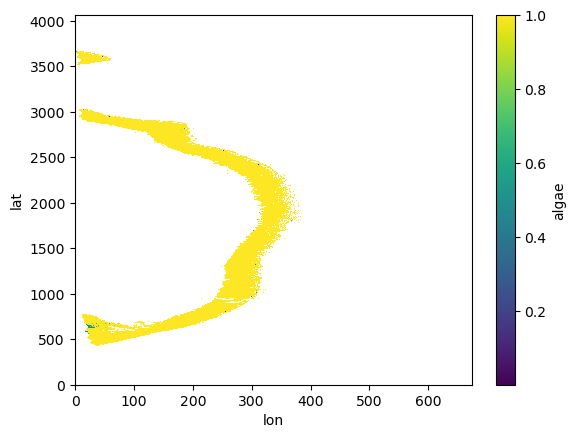

In [44]:
irregular_prism.algae.plot()

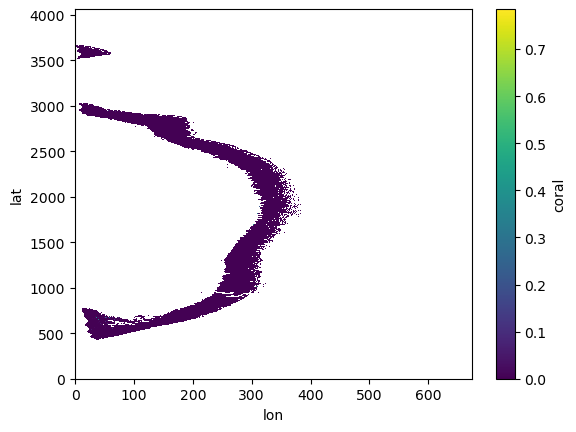

In [42]:
irregular_prism.coral.plot()

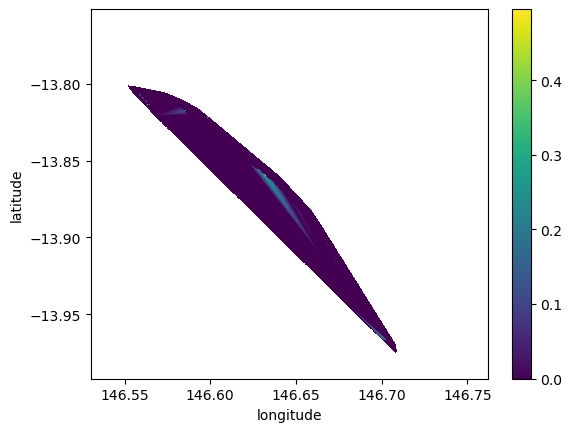

In [41]:
regridded = xa.DataArray(
    data_new,
    coords={'latitude': lats_new, 'longitude': lons_new},
    dims=['latitude', 'longitude']
)

regridded.plot()


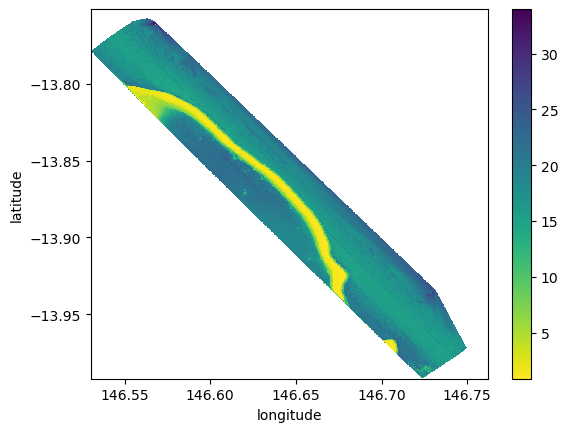

*1000 works fine with depth*

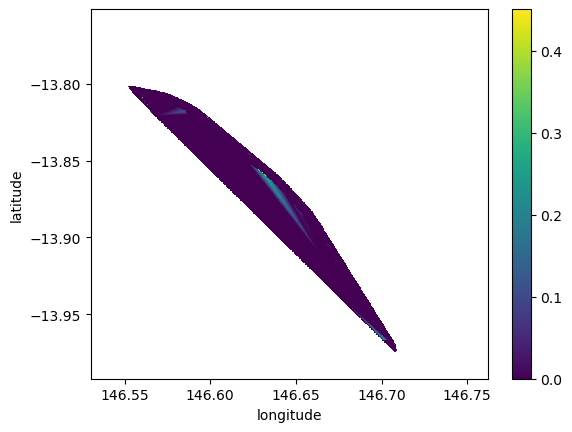

*1000 looks very artefacty with coral*

## With python cdo

Can't get it to work with 2d input grid

In [ ]:
test

<xarray.Dataset> Size: 33MB
Dimensions:  (lat: 4065, lon: 674, j: 4065, i: 674)
Coordinates:
    lat      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
    lon      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
Dimensions without coordinates: j, i
Data variables:
    depth    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan

In [ ]:
from cdo import Cdo
import tempfile

cdo = Cdo()

xfirst = lons.min().values
yfirst = lats.min().values
n_resolution = 100
resolution = 0.01
# Create a temporary file for the target grid
with tempfile.NamedTemporaryFile(delete=False, mode='w') as temp_grid_file:
    temp_grid_file.write(f"""
    gridtype = latlon
    xsize    = {n_resolution}
    ysize    = {n_resolution}
    xfirst   = {xfirst}
    xinc     = {resolution}
    yfirst   = {yfirst}
    yinc     = {resolution}
    """)
    temp_grid_file_path = temp_grid_file.name

# Create a temporary file for the regridded output
with tempfile.NamedTemporaryFile(delete=False, suffix='.nc') as temp_output_file:
    temp_output_file_path = temp_output_file.name


regridded["latitude"].attrs["units"] = "degrees_north"
regridded["longitude"].attrs["units"] = "degrees_east"
test["lat"].attrs["units"] = "degrees_north"
test["lon"].attrs["units"] = "degrees_east"
# Perform the regridding
out = cdo.remapbil(temp_grid_file_path, input=test, returnXDataset=True)
# # Load the regridded data into xarray
# d1_regridded = xr.open_dataset(temp_output_file_path)

Error in calling operator remapbil with:
>>> cdo -O -s -f nc -remapbil,/var/folders/tp/x_9dbyf149d6kw_k79l_kk4m0000gq/T/tmppvtkwgpk /var/folders/tp/x_9dbyf149d6kw_k79l_kk4m0000gq/T/cdoPy_arefncy /var/folders/tp/x_9dbyf149d6kw_k79l_kk4m0000gq/T/cdoPys1qi374t<<<
STDOUT:
STDERR:
cdo    remapbil (Abort): Unsupported generic coordinates (Variable: depth)!



CDOException: (returncode:1) 
cdo    remapbil (Abort): Unsupported generic coordinates (Variable: depth)!


In [ ]:
lats.min().values

array(-13.991783, dtype=float32)

In [ ]:
np.linspace(lats.min().values, lats.max().values, 10)

array([-13.991783, -13.965093, -13.938402, -13.911712, -13.885021,
       -13.858331, -13.83164 , -13.80495 , -13.778259, -13.751569],
      dtype=float32)

In [ ]:
target_grid = xa.Dataset(
    {
        "lat": (["lat"], np.linspace(lats.min().values, lats.max().values, 100)),
        "lon": (["lon"], np.linspace(lons.min().values, lons.max().values, 100)),
    }
)
target_grid

<xarray.Dataset> Size: 800B
Dimensions:  (lat: 100, lon: 100)
Coordinates:
  * lat      (lat) float32 400B -13.99 -13.99 -13.99 ... -13.76 -13.75 -13.75
  * lon      (lon) float32 400B 146.5 146.5 146.5 146.5 ... 146.8 146.8 146.8
Data variables:
    *empty*

In [ ]:
target_grid.plot.scatter(x="lon", y="lat", s=10)

ModuleNotFoundError: No module named 'matplotlib'

In [ ]:
test

<xarray.Dataset> Size: 33MB
Dimensions:  (lat: 4065, lon: 674, j: 4065, i: 674)
Coordinates:
    lat      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
    lon      (j, i) float32 11MB nan nan nan nan nan nan ... nan nan nan nan nan
Dimensions without coordinates: j, i
Data variables:
    depth    (lat, lon) float32 11MB nan nan nan nan nan ... nan nan nan nan nan

In [ ]:
target_grid

<xarray.Dataset> Size: 800B
Dimensions:  (lat: 100, lon: 100)
Coordinates:
  * lat      (lat) float32 400B -13.99 -13.99 -13.99 ... -13.76 -13.75 -13.75
  * lon      (lon) float32 400B 146.5 146.5 146.5 146.5 ... 146.8 146.8 146.8
Data variables:
    *empty*

In [ ]:
regridder = xe.Regridder(test, target_grid, method="bilinear")

: 

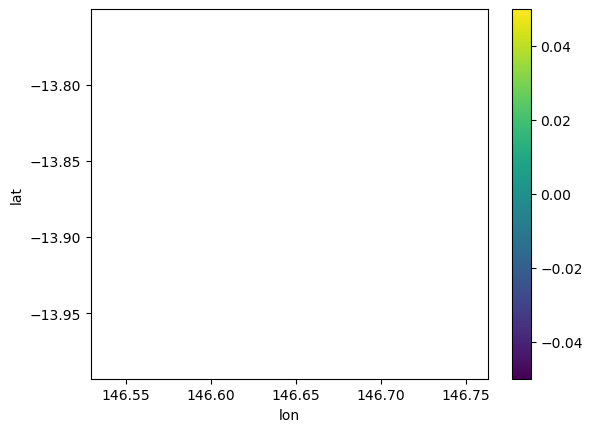

In [ ]:
test_regridded = regridder(test['depth'])
test_regridded.plot()

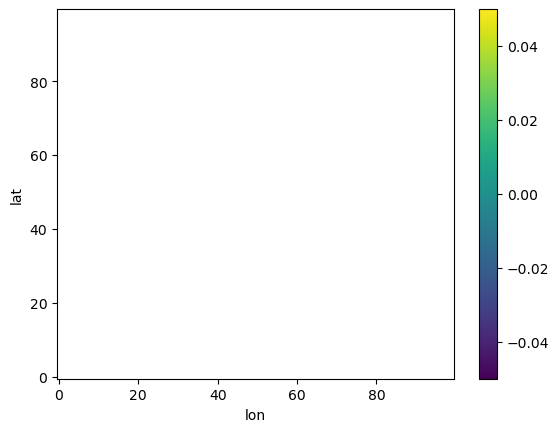

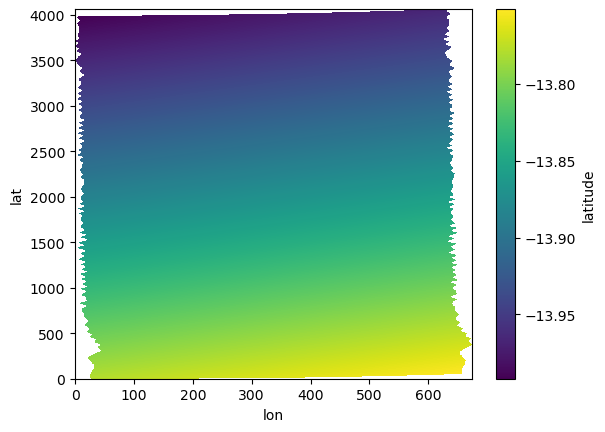

In [ ]:
test.latitude.plot()

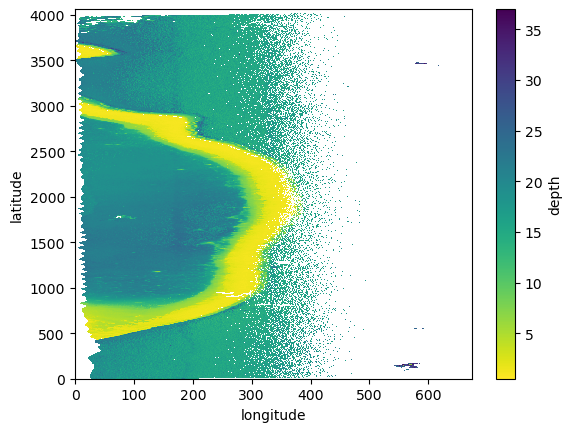

In [ ]:
# plot with inverted colourmap
test["depth"].plot(cmap="viridis_r")

In [ ]:
# assign "latitude", "longitude" as dimensions
test.assign_coords({"latitude": lats, "longitude": lons})

<xarray.Dataset> Size: 5GB
Dimensions:    (number_of_bands: 246, number_of_scans: 4065,
                pixels_per_scan: 674, number_of_benthic_bands: 92)
Coordinates:
    latitude   (number_of_scans, pixels_per_scan) float32 11MB ...
    longitude  (number_of_scans, pixels_per_scan) float32 11MB ...
Dimensions without coordinates: number_of_bands, number_of_scans,
                                pixels_per_scan, number_of_benthic_bands
Data variables:
    Rsw        (number_of_bands, number_of_scans, pixels_per_scan) float32 3GB ...
    Rb         (number_of_benthic_bands, number_of_scans, pixels_per_scan) float32 1GB ...
    depth      (number_of_scans, pixels_per_scan) float32 11MB ...
    coral      (number_of_scans, pixels_per_scan) float32 11MB ...
    sand       (number_of_scans, pixels_per_scan) float32 11MB ...
    algae      (number_of_scans, pixels_per_scan) float32 11MB ...
    GPP        (number_of_scans, pixels_per_scan) float32 11MB ...
    G          (number_of_scans, pixels_per_scan) float32 11MB ...
    Kd         (number_of_benthic_bands, number_of_scans, pixels_per_scan) float32 1GB ...

(array([1.28793582e+08, 2.28000000e+03, 1.20000000e+02, 1.30000000e+01,
        1.40000000e+01, 4.00000000e+00, 4.00000000e+00, 3.00000000e+00,
        1.00000000e+01, 1.40000000e+01]),
 array([8.96965677e-04, 1.10403221e+02, 2.20805557e+02, 3.31207886e+02,
        4.41610199e+02, 5.52012512e+02, 6.62414856e+02, 7.72817200e+02,
        8.83219543e+02, 9.93621826e+02, 1.10402417e+03]),
 <BarContainer object of 10 artists>)

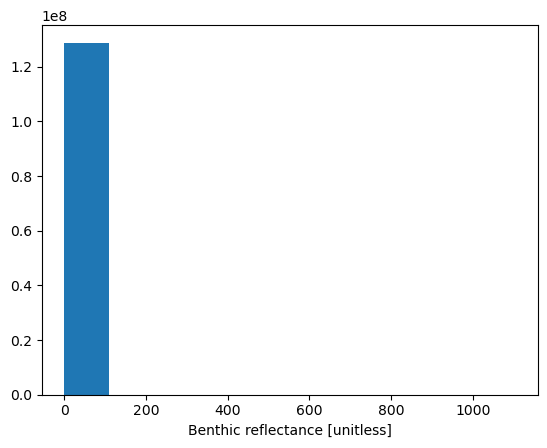

In [ ]:
test["Rb"].plot()

In [ ]:
nav_data.sensor_zenith.shape

(4065, 674)

In [ ]:
derived_data.coral.shape

(4065, 674)

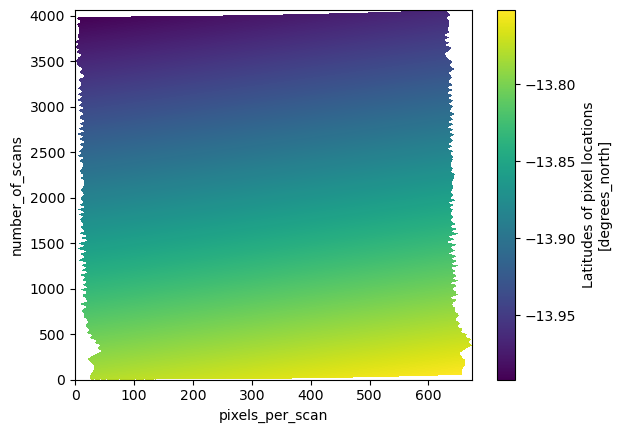

In [ ]:
derived_data["latitude"].plot()

In [ ]:
# load nc
fp_L1 = Path("/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/reeftruth/data/prism/PRM2016253002547.L1B.nc")
fp_L2 = Path("/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/reeftruth/data/prism/PRM2016253002547.L2.nc")
fp_L2 = Path("/Users/rt582/Downloads/PRM2016253002547.L1B.nc")
nc_L1 = xa.open_dataset(fp_L2, chunks=None, engine='netcdf4')
# explore image
nc_L1

In [ ]:
eg = xa.open_dataset("/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/potentially_useful/AQUA_MODIS.20020704_20230930.L3m.CU.CHL.chlor_a.4km.nc")
eg

<xarray.Dataset> Size: 149MB
Dimensions:  (lat: 4320, lon: 8640, rgb: 3, eightbitcolor: 256)
Coordinates:
  * lat      (lat) float32 17kB 89.98 89.94 89.9 89.85 ... -89.9 -89.94 -89.98
  * lon      (lon) float32 35kB -180.0 -179.9 -179.9 ... 179.9 179.9 180.0
Dimensions without coordinates: rgb, eightbitcolor
Data variables:
    chlor_a  (lat, lon) float32 149MB ...
    palette  (rgb, eightbitcolor) uint8 768B ...
Attributes: (12/64)
    product_name:                      AQUA_MODIS.20020704_20230930.L3m.CU.CH...
    instrument:                        MODIS
    title:                             MODISA Level-3 Standard Mapped Image
    project:                           Ocean Biology Processing Group (NASA/G...
    platform:                          Aqua
    source:                            satellite observations from MODIS-Aqua
    ...                                ...
    identifier_product_doi:            10.5067/AQUA/MODIS/L3M/CHL/2022
    keywords:                          Earth Science > Oceans > Ocean Chemist...
    keywords_vocabulary:               NASA Global Change Master Directory (G...
    data_bins:                         23257472
    data_minimum:                      0.0016383681
    data_maximum:                      85.86637

In [ ]:
from netCDF4 import Dataset
nc = Dataset("/Users/rt582/Downloads/PRM2016288001459.L2.nc", 'r')
print(nc.variables)

In [ ]:
print(nc_L1.variables)

In [ ]:
xa.open_dataset("/Users/rt582/Downloads/PRM2016288001459-L2.nc").plot.scatter()